In [ ]:
import os
import cv2

# Define input and output directories
input_folder = 'Videos'  # Folder containing video files
output_folder = 'Frames'  # Folder to save extracted frames
frame_rate = 30  # Frame extraction rate (frames per second)

# Frame Extraction
def extract_frames_from_folder(input_folder, output_folder, frame_rate=30):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
        
    for video_file in os.listdir(input_folder):
        video_path = os.path.join(input_folder, video_file)
        
        if os.path.isfile(video_path) and video_file.lower().endswith(('.mp4', '.avi', '.mov', '.mkv')):  # Check for video files
            video_name = os.path.splitext(video_file)[0]
            video_output_folder = os.path.join(output_folder, video_name)

            if not os.path.exists(video_output_folder):
                os.makedirs(video_output_folder)
            
            # Open the video file
            cap = cv2.VideoCapture(video_path)
            fps = cap.get(cv2.CAP_PROP_FPS)
            
            if fps == 0:  # Check if FPS is valid
                print(f"Error: FPS is zero for video {video_file}. Skipping.")
                continue
            
            frame_interval = max(1, int(fps / frame_rate))  # Prevent division by zero
            count = 0

            while cap.isOpened():
                ret, frame = cap.read()
                if not ret:
                    break
                if count % frame_interval == 0:
                    frame_name = f"{video_name}_frame_{count}.jpg"
                    frame_path = os.path.join(video_output_folder, frame_name)
                    cv2.imwrite(frame_path, frame)  # Save the frame
                    print(f"Frame saved: {frame_path}")
                count += 1
            cap.release()

# Main function to run the frame extraction
def main():
    # Extract frames from all videos in the input folder
    extract_frames_from_folder(input_folder, output_folder, frame_rate)
    print("Frame extraction completed. Frames saved in:", output_folder)

if __name__ == "__main__":
    main()


In [5]:
import os
import tensorflow as tf
import numpy as np
from PIL import Image

# Paths
input_folder = "Frames"  # Folder containing 9 subfolders
output_folder = "Normal_Dataset"  # Folder to save processed images
image_size = (224, 224)  # Resize to 224x224

# Create output folder if not exists
os.makedirs(output_folder, exist_ok=True)

# Function to normalize and save images
def normalize_and_save(image_array, save_path):
    # Normalize to [0, 1]
    image_array = image_array / 255.0
    # Convert back to image format (scale to 0-255 for saving)
    normalized_image = Image.fromarray((image_array * 255).astype(np.uint8))
    normalized_image.save(save_path)

# Iterate through each subfolder
for subfolder in os.listdir(input_folder):
    subfolder_path = os.path.join(input_folder, subfolder)
    if os.path.isdir(subfolder_path):
        # Create corresponding output subfolder
        output_subfolder = os.path.join(output_folder, subfolder)
        os.makedirs(output_subfolder, exist_ok=True)

        for img_name in os.listdir(subfolder_path):
            img_path = os.path.join(subfolder_path, img_name)
            if img_path.endswith(('.jpg', '.jpeg', '.png')):  # Check for image formats
                # Load the image
                img = tf.keras.preprocessing.image.load_img(img_path, target_size=image_size)
                img_array = tf.keras.preprocessing.image.img_to_array(img)

                # Save normalized image
                save_path = os.path.join(output_subfolder, img_name)
                normalize_and_save(img_array, save_path)

print("Processing complete. Normalized images saved in:", output_folder)

Processing complete. Normalized images saved in: Normal_Dataset


Visualizing class distribution...


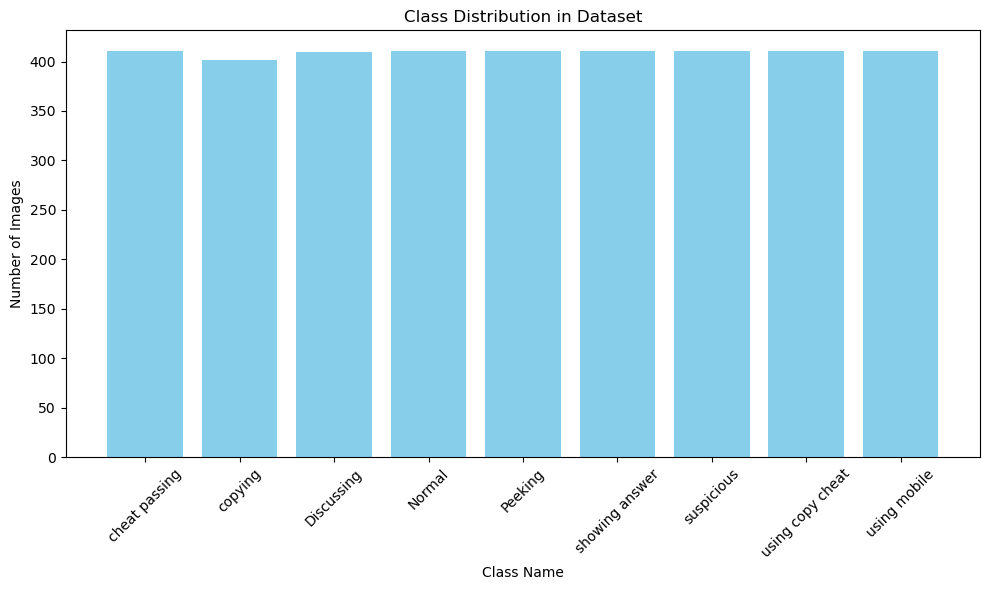

Visualizing sample images for each class...


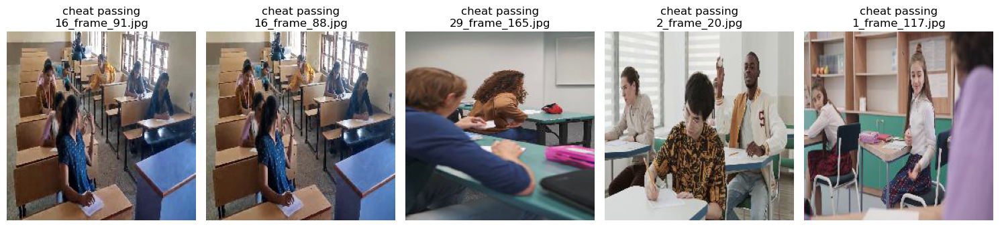

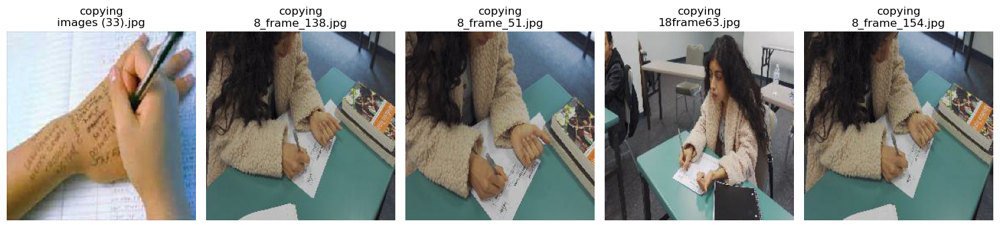

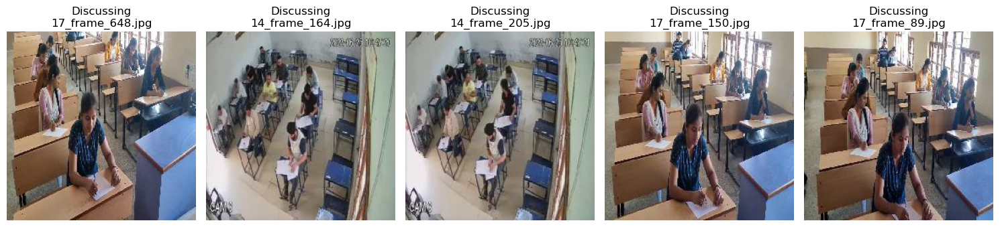

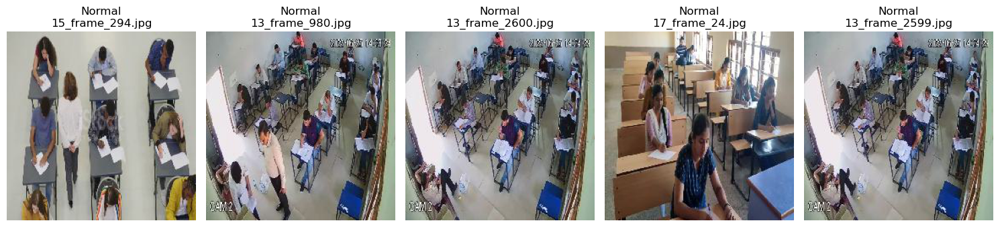

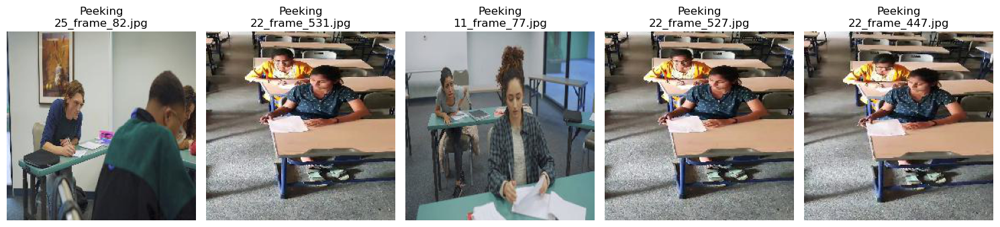

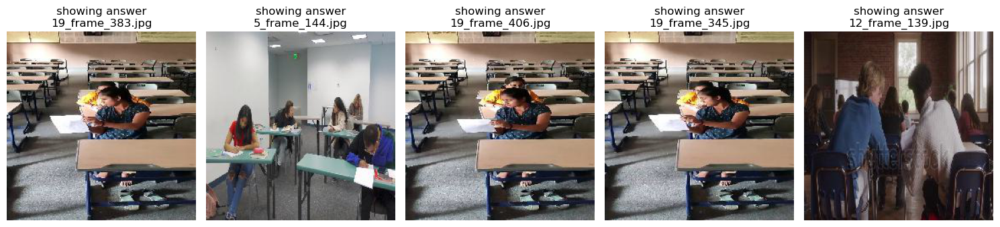

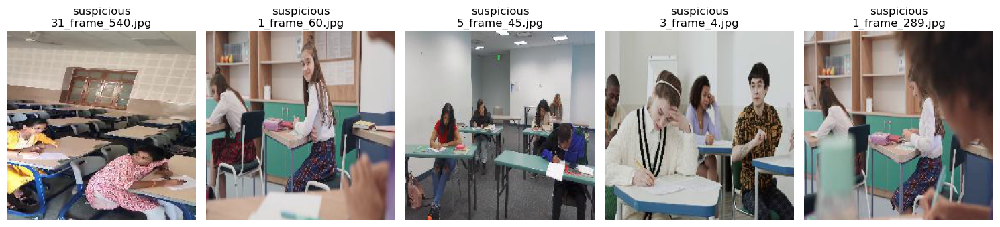

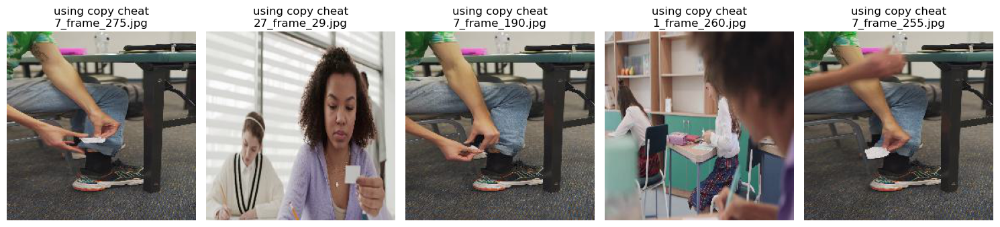

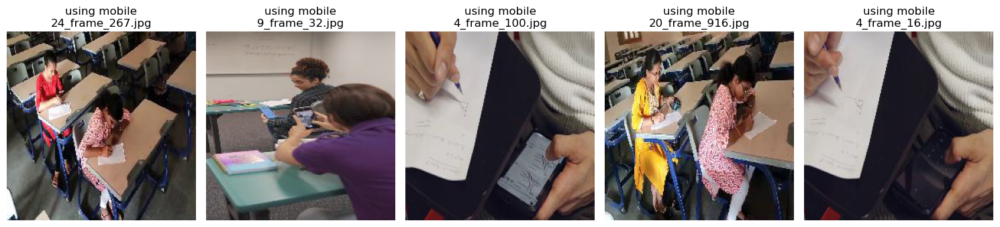

In [6]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import random

# Visualization of class distribution
def visualize_class_distribution(folder_path):
    class_counts = {}
    
    for class_name in os.listdir(folder_path):
        class_folder = os.path.join(folder_path, class_name)
        if os.path.isdir(class_folder):
            num_images = len([f for f in os.listdir(class_folder)
                              if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
            class_counts[class_name] = num_images
    
    # Plot the distribution
    plt.figure(figsize=(10, 6))
    plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
    plt.xlabel('Class Name')
    plt.ylabel('Number of Images')
    plt.title('Class Distribution in Dataset')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Visualization of sample images for each class
def visualize_sample_images(folder_path, samples_per_class=5):
    for class_name in os.listdir(folder_path):
        class_folder = os.path.join(folder_path, class_name)
        if os.path.isdir(class_folder):
            image_files = [os.path.join(class_folder, f) for f in os.listdir(class_folder)
                           if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
            
            if len(image_files) == 0:
                continue
            
            # Select random samples
            selected_images = random.sample(image_files, min(samples_per_class, len(image_files)))
            
            # Plot the images
            plt.figure(figsize=(15, 5))
            for i, img_path in enumerate(selected_images):
                image = Image.open(img_path)
                plt.subplot(1, samples_per_class, i + 1)
                plt.imshow(image)
                plt.axis('off')
                plt.title(f"{class_name}\n{os.path.basename(img_path)}")
            plt.tight_layout()
            plt.show()

# Main function to run visualizations
def main_visualize():
    dataset_path = 'Normal_Dataset'  # Replace with your dataset path
    
    # Visualize class distribution
    print("Visualizing class distribution...")
    visualize_class_distribution(dataset_path)
    
    # Visualize sample images
    print("Visualizing sample images for each class...")
    visualize_sample_images(dataset_path, samples_per_class=5)

if __name__ == "__main__":
    main_visualize()


Visualizing class distribution and generating table...


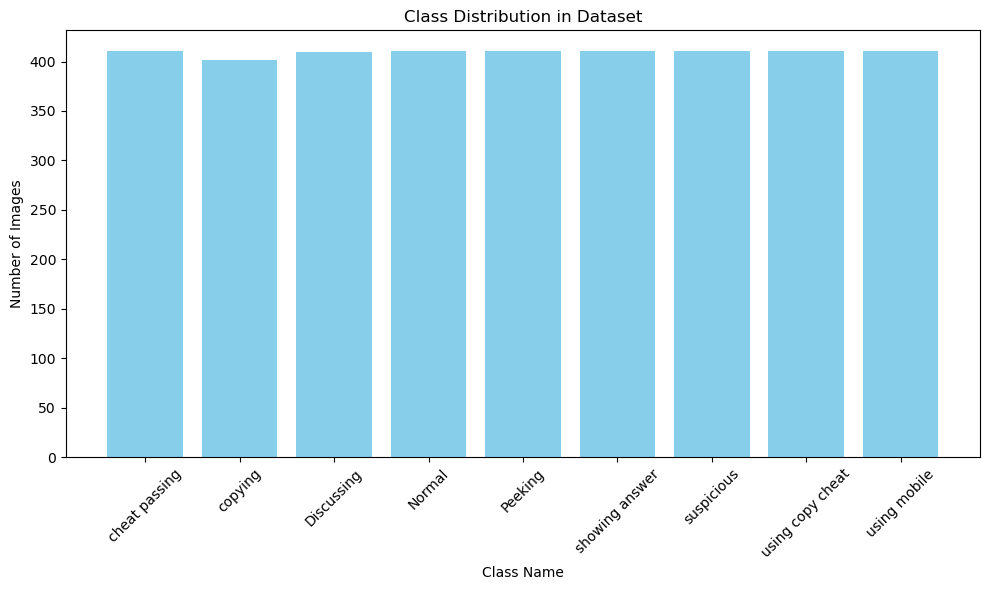


Class Distribution Table:
+------------------+--------------------+
| Class Name       |   Number of Images |
+==================+====================+
| cheat passing    |                411 |
+------------------+--------------------+
| copying          |                402 |
+------------------+--------------------+
| Discussing       |                410 |
+------------------+--------------------+
| Normal           |                411 |
+------------------+--------------------+
| Peeking          |                411 |
+------------------+--------------------+
| showing answer   |                411 |
+------------------+--------------------+
| suspicious       |                411 |
+------------------+--------------------+
| using copy cheat |                411 |
+------------------+--------------------+
| using mobile     |                411 |
+------------------+--------------------+

Visualizing sample images for each class...


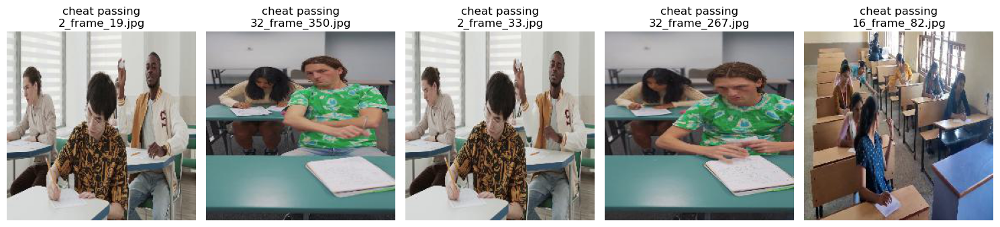

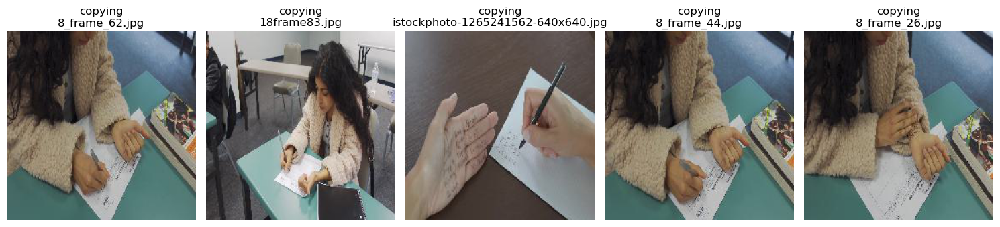

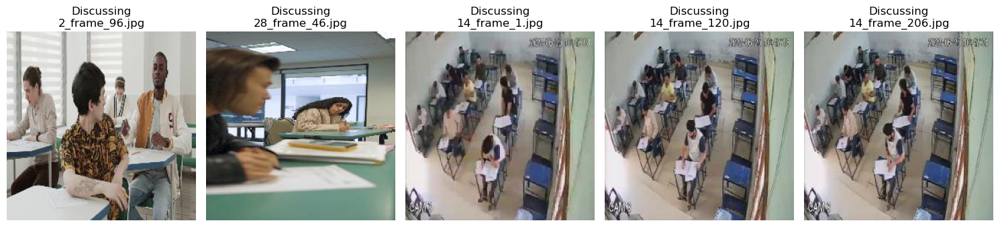

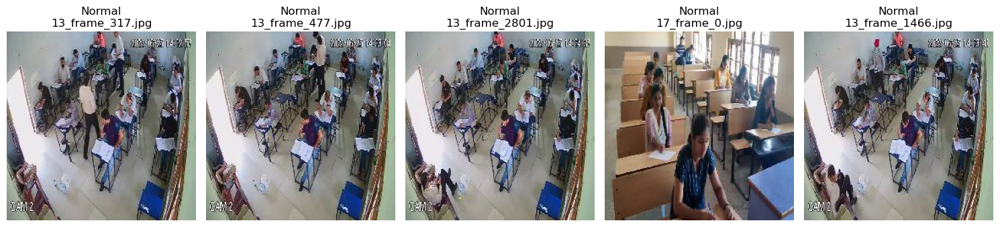

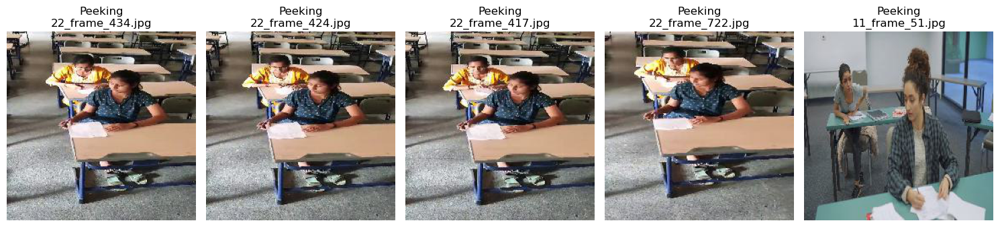

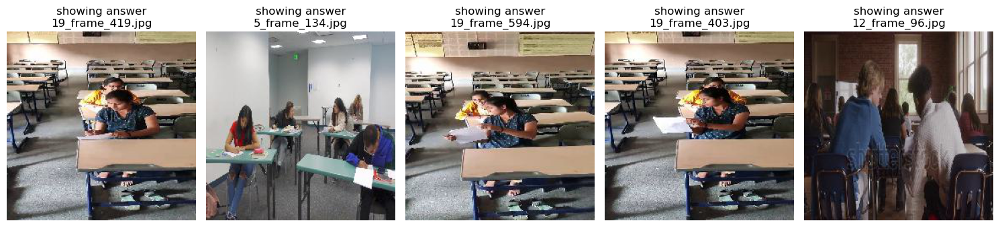

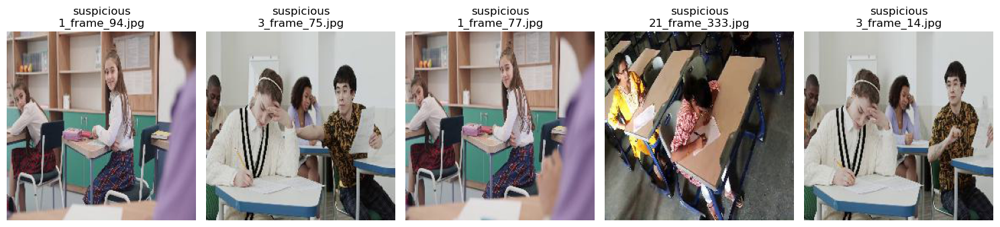

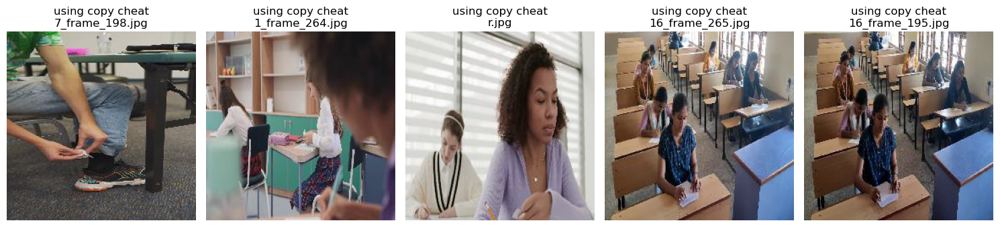

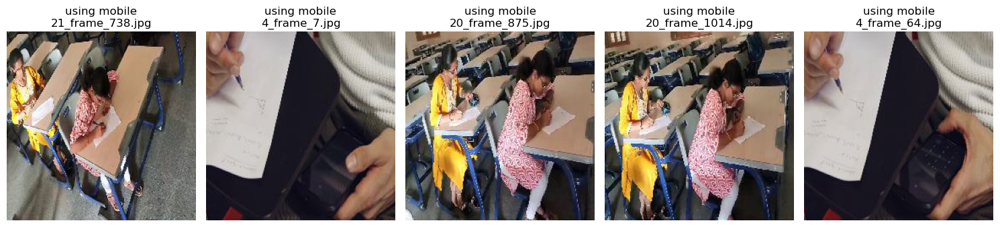

In [7]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import random
from tabulate import tabulate

# Visualization of class distribution
def visualize_class_distribution(folder_path):
    class_counts = {}
    
    for class_name in os.listdir(folder_path):
        class_folder = os.path.join(folder_path, class_name)
        if os.path.isdir(class_folder):
            num_images = len([f for f in os.listdir(class_folder)
                              if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
            class_counts[class_name] = num_images
    
    # Plot the distribution
    plt.figure(figsize=(10, 6))
    plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
    plt.xlabel('Class Name')
    plt.ylabel('Number of Images')
    plt.title('Class Distribution in Dataset')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    
    # Display the class counts as a table
    print("\nClass Distribution Table:")
    table_data = [[class_name, count] for class_name, count in class_counts.items()]
    print(tabulate(table_data, headers=["Class Name", "Number of Images"], tablefmt="grid"))

# Visualization of sample images for each class
def visualize_sample_images(folder_path, samples_per_class=5):
    for class_name in os.listdir(folder_path):
        class_folder = os.path.join(folder_path, class_name)
        if os.path.isdir(class_folder):
            image_files = [os.path.join(class_folder, f) for f in os.listdir(class_folder)
                           if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
            
            if len(image_files) == 0:
                continue
            
            # Select random samples
            selected_images = random.sample(image_files, min(samples_per_class, len(image_files)))
            
            # Plot the images
            plt.figure(figsize=(15, 5))
            for i, img_path in enumerate(selected_images):
                image = Image.open(img_path)
                plt.subplot(1, samples_per_class, i + 1)
                plt.imshow(image)
                plt.axis('off')
                plt.title(f"{class_name}\n{os.path.basename(img_path)}")
            plt.tight_layout()
            plt.show()

# Main function to run visualizations
def main_visualize():
    dataset_path = 'Normal_Dataset'  # Replace with your dataset path
    
    # Visualize class distribution and table
    print("Visualizing class distribution and generating table...")
    visualize_class_distribution(dataset_path)
    
    # Visualize sample images
    print("\nVisualizing sample images for each class...")
    visualize_sample_images(dataset_path, samples_per_class=5)

if __name__ == "__main__":
    main_visualize()


# renaming

In [ ]:
import os
import cv2
from PIL import Image

# Define the input and output directories
input_dir = "Normal_dataset"  # Replace with your dataset path
output_dir = "Final_dataset"  # Replace with your desired output path

# Ensure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# Iterate over each folder (behavioral labels) in the dataset
for label in os.listdir(input_dir):
    label_path = os.path.join(input_dir, label)
    if os.path.isdir(label_path):  # Check if it's a directory
        
        # Create a corresponding folder in the output directory
        output_label_dir = os.path.join(output_dir, label)
        os.makedirs(output_label_dir, exist_ok=True)

        # Iterate over each image in the label folder
        for i, image_name in enumerate(os.listdir(label_path)):
            image_path = os.path.join(label_path, image_name)

            try:
                # Read and resize the image
                image = cv2.imread(image_path)
                resized_image = cv2.resize(image, (244, 244))

                # Save the image with the new name
                new_name = f"{label}_{i + 1}.jpg"
                output_path = os.path.join(output_label_dir, new_name)
                cv2.imwrite(output_path, resized_image)

            except Exception as e:
                print(f"Error processing {image_path}: {e}")

print("Dataset preparation complete!")
